In [1]:
#import os
import sys
sys.path.append("../python/")
from helpers import *
#import pickle
import numpy as np
import pandas as pd
#import matplotlib.pyplot as plt
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.gradcam_plus_plus import GradcamPlusPlus
from tf_keras_vis.utils import normalize
from tf_keras_vis.utils.scores import CategoricalScore
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear

from scipy.special import softmax

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.ticker as tkr
from itertools import combinations
from scipy.stats import ttest_ind, f_oneway # for independent t-test

import math

from collections import Counter
import statistics as stat
from matplotlib.ticker import FormatStrFormatter, MaxNLocator

In [2]:
# Globals
NUM_CHANNELS = 3
RESOLUTION_LIST = [336]
SCENARIO_LIST = ["PrPo_Im"] #, "Pr_Im", "Pr_PoIm", "Pr_Po_Im"]
NUM_EPOCHS = 20
AUGMENTATION = 'fliplr'
SAVED_MODEL_DIR = '../../results/models/'
MODEL_PERFORMANCE_METRICS_DIR = '../../results/model-performance/'
FULL_MODEL_PATH = '../../results/models/opt-cnn-base-PrPo_Im-w-336-px-h-336-px/model'

In [3]:
trial_seed = 1
class_labels = getClassLabels("PrPo_Im")

In [4]:
GLOBAL_MODEL = models.load_model(FULL_MODEL_PATH)

In [5]:
IMAGE_SETS_SQUARE_TRAIN = createResolutionScenarioImageDict(RESOLUTION_LIST, SCENARIO_LIST, augmentation=AUGMENTATION, type='train', rectangular = False)
IMAGE_SETS_SQUARE_TEST = createResolutionScenarioImageDict(RESOLUTION_LIST, SCENARIO_LIST, augmentation=AUGMENTATION, type='test', rectangular = False)
IMAGE_SETS_SQUARE_VALIDATION = createResolutionScenarioImageDict(RESOLUTION_LIST, SCENARIO_LIST, augmentation=AUGMENTATION, type='validation', rectangular = False)

{336: {'PrPo_Im': array([[array([[[0.40392157, 0.50980392, 0.32156863],
                [0.4745098 , 0.57647059, 0.33333333],
                [0.56078431, 0.6627451 , 0.35686275],
                ...,
                [0.20784314, 0.27843137, 0.18431373],
                [0.13333333, 0.19607843, 0.14509804],
                [0.1254902 , 0.18823529, 0.1372549 ]],

               [[0.39215686, 0.50980392, 0.29411765],
                [0.52156863, 0.64313725, 0.32941176],
                [0.41568627, 0.53333333, 0.2745098 ],
                ...,
                [0.17647059, 0.23921569, 0.17254902],
                [0.12941176, 0.19607843, 0.14901961],
                [0.11372549, 0.17647059, 0.1372549 ]],

               [[0.25098039, 0.36470588, 0.29411765],
                [0.31372549, 0.41960784, 0.30196078],
                [0.35686275, 0.47058824, 0.31764706],
                ...,
                [0.11372549, 0.16862745, 0.12941176],
                [0.11372549, 0.17647059, 0.12941176

In [6]:
training_images, training_labels = getImageAndLabelArrays(IMAGE_SETS_SQUARE_TRAIN[336]["PrPo_Im"])
test_images, test_labels = getImageAndLabelArrays(IMAGE_SETS_SQUARE_TEST[336]["PrPo_Im"])
validation_images, validation_labels = getImageAndLabelArrays(IMAGE_SETS_SQUARE_VALIDATION[336]["PrPo_Im"])

In [7]:
training_images = np.concatenate((training_images,validation_images))
training_labels = np.concatenate((training_labels,validation_labels))

In [8]:
m = GLOBAL_MODEL

In [9]:
# Obtain model predictions
y_pred = m.predict(np.squeeze(test_images))

In [10]:
# Overview of negative and positive class predictions
df = pd.DataFrame(y_pred, columns = ['class 0', 'class 1'])
df

,class 0,class 1
0,0.337132,0.662868
1,0.558997,0.441003
2,0.714647,0.285353
3,0.716542,0.283458
4,0.543280,0.456721
...,...,...
166,0.512333,0.487667
167,0.277936,0.722064
168,0.262147,0.737853
169,0.236584,0.763416


In [11]:
def getPredictionGroupProbability(yPred, img_idx):
    """Returns the prediction group (TP/FP/TN/FN) and 
    the prediction probability of a test image index as a tuple."""
    prediction_probability = np.round(max(yPred[img_idx]),2)
    observed_class  = np.argmax(test_labels[img_idx])
    predicted_class = np.argmax(yPred[img_idx])
    if observed_class == 1:
        if predicted_class == observed_class: # true positive
            group = 'tp'
        else: # false negative
            group = 'fn' 
    else:
        if predicted_class == observed_class: # true negative
            group = 'tn'
        else: # false positive
            group = 'fp'
    return (group, prediction_probability)

In [12]:
idx_pred = getPredictionGroupProbability(y_pred, 119)

In [13]:
def generateGradcam(model, img_idx, plus=False):
    """Returns a heatmap with a Gradcam object.
    https://keisen.github.io/tf-keras-vis-docs/examples/attentions.html#GradCAM
    """
    img_array = np.squeeze(test_images[img_idx]) # Remove an axis from the image array
    score = CategoricalScore(np.argmax(y_pred[img_idx])) # Returns the target score: 0 for negative, 1 for positive
    replace2linear = ReplaceToLinear() # Replaces the softmax activation f-n applied to the last layer
    # Creates Gradcam object
    if plus:
        gcam_obj = GradcamPlusPlus(model,
                   model_modifier=replace2linear,
                   clone=True)
    else: 
        gcam_obj = Gradcam(model,
                   model_modifier=replace2linear,
                   clone=True)
    # Generates heatmap with GradCAM
    cam = gcam_obj(score,
              img_array,
              penultimate_layer=-1)
    return cam

In [14]:
grad_cam = generateGradcam(m,121,True)

In [15]:
def renderGradcam(model,yPred,img_idx,plus=False,save_fig=False):
    """Visualizes the attention over input using the penultimate layer output"""
    gradcam_dir = '../../figures/plottingGradCam/7_15_2022/'
    prediction_probability = getPredictionGroupProbability(yPred, img_idx)
    gcam = generateGradcam(model,img_idx,plus)
    plt.figure(figsize=(5, 5))
    plt.tight_layout()
    heatmap = np.uint8(cm.jet(gcam[0])[..., :3] * 255)
    plt.imshow(np.squeeze(np.squeeze(test_images[img_idx]))) # remove axes of length one from the test image index
    plt.imshow(heatmap, alpha=0.5) # overlay
    # plt.colorbar(label="Gradcam score", orientation="vertical")
    plt.axis('off')
    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    if save_fig:
        if not os.path.exists(gradcam_dir):
            os.makedirs(gradcam_dir)
        save_name = gradcam_dir+"index_"+str(img_idx)+"_"+prediction_probability[0]+"_"+str(prediction_probability[1])
        if plus:
            save_name += '_plus'
        plt.savefig(save_name+".png")
    plt.show()

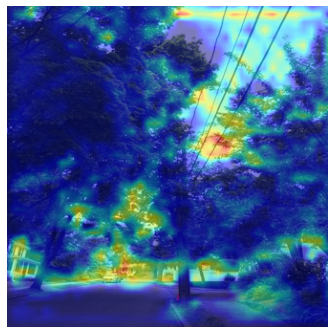

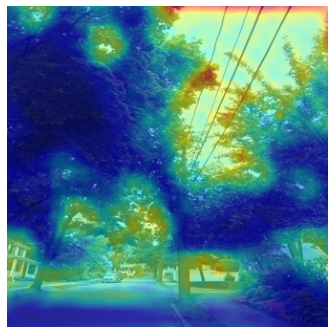

In [16]:
g_index = 29
renderGradcam(m,y_pred,g_index,False,True)
renderGradcam(m,y_pred,g_index,True,True)

In [31]:
#### PREVIOUS IMPLEMENETATION ###
# def generateGradcam(index): 
#     cam_img = index # class activation map corresponds to the specified image index 
#     probPrediction = [] # store probability of prediction by the CNN
#     predictedClass = [] # store CNN-predicted class 
#     # class_labels = getClassLabels("PrPo_Im")
#     print("Observed image class: ", class_labels[np.argmax(test_labels[cam_img])])
#     m = GLOBAL_MODEL
#     def loss(output):
#         """Returns score corresponding to class of given image index"""                                       
#         print("Loss output: ", output) ##
#         loss_list = [output[i][j] for i, j in enumerate([np.argmax(j) for j in test_labels[cam_img] ])]
#         print(loss_list)
#         probPrediction.append(str([np.round(max(softmax(loss)), 2) for loss in output.numpy()])[1:-1])
#         predictedClass.append(class_labels[np.argmax([softmax(loss) for loss in output.numpy()])])
#         print('Probability of prediction: ', probPrediction)
#         print('Predicted class: ', predictedClass)
#         print([softmax(loss) for loss in output.numpy()])
#         return loss_list

#     # print('Class labels: ', class_labels)
    
#     # Model_modifier function required for gradcam
#     def model_modifier(model):
#         """Remove softmax activation of last layer in model"""
#         model.layers[-1].activation = tf.keras.activations.linear # Assign linear activation function (pass-through) to the activation of layer at -1
#         return model
    
#     gradcam_image = np.squeeze(test_images[cam_img])
#     gradcam = Gradcam(m, model_modifier = model_modifier)
#     cam = gradcam(loss, gradcam_image, penultimate_layer = -1) # Penultimate layer is a fully-connected hidden layer. 
#     cam = normalize(cam)
#     cam = np.squeeze(cam) # replace np.squeeze 
#     print(gradcam_image.shape)
#     print("Shape of heatmap matrix:", cam.shape )
#     return cam, gradcam_image, probPrediction, predictedClass

In [30]:
#### PREVIOUS IMPLEMENETATION ###
# def renderGradCam(index, save=False, grid=False, c_map='gist_gray'):
#     '''Visualizing gradient-weighted class activation maps as an overlay (heatmap) to the original image.'''
#     gradcam_dir = '../../figures/plottingGradCam/6_27_2022/'
#     gcam = generateGradcam([index])
#     # class_labels = getClassLabels("PrPo_Im")
#     save_name = ""
#     if grid==False:
#         plt.figure(figsize=(5, 5))
#         # plt.suptitle('Grad-CAM Index '+str(index)[1:-1]+'\n')
#         # plt.title('Observed class: '+class_labels[np.argmax(test_labels[index])], y=-0.08)
#         # plt.text(-0.7,-0.05, "Probability of prediction: "+ str("{:.0%}".format(float(str(gcam[2])[2:-2])))+'\n', size=12)
#         # plt.text(-0.7,-0.35, 'Predicted class: '+ str(gcam[3])[2:-2], size=12)
#         plt.axis('off')
#         plt.tight_layout()
#         heatmap = np.uint8(cm.jet(gcam[0])[..., :3] * 255)
#         plt.imshow(np.squeeze(gcam[1]), cmap=c_map) # remove axes of length one from gradcam_images
#         plt.imshow(heatmap, alpha=0.5) # overlay
#         plt.colorbar(label="Gracam score", orientation="horizontal")
#         plt.tight_layout()
#         plt.subplots_adjust(top=0.92)
#         plt.show()
#     else:
#         plt.axis('off')
#         plt.tight_layout()
#         heatmap = np.uint8(cm.jet(gcam[0])[..., :3] * 255)
#         plt.imshow(np.squeeze(gcam[1]), cmap=c_map)
#         plt.imshow(heatmap, cmap='gist_gray', alpha=0.5)
#     # print(gradcam_dir+"gradcam-"+str(index)[1:-1])
#     predicted_class = str(gcam[3])[2:-2]
#     observed_class = class_labels[np.argmax(test_labels[index])]
#     if predicted_class == "Probable/Possible" and predicted_class == observed_class:
#         save_name = "tp"
#     elif predicted_class == "Probable/Possible" and predicted_class != observed_class:
#         save_name = "fp"
#     elif predicted_class == "Improbable" and predicted_class == observed_class:
#         save_name = "tn"
#     elif predicted_class == "Improbable" and predicted_class != observed_class:
#         save_name = "fn"
#     print(save_name)
#     if save:
#         if not os.path.exists(gradcam_dir):
#             os.makedirs(gradcam_dir)
#         plt.savefig(gradcam_dir+"index_"+str(index)+"_"+save_name+"_"+str("{:.2f}".format(float(str(gcam[2])[2:-2])))+".png")
#     print(str(gcam[3])[2:-2])
#     return (heatmap)

In [48]:
#### PREVIOUS IMPLEMENETATION ###
# def analyzePredictions(labels):
#     """Returns the indices and prediction probabilities of the test images for both correct and incorrect predictions. 
#     The total number for each class should equal the corresponding value in the confusion matrix.
#     Currently only scenario PrPo_Im is supported."""
#     im = labels[0]
#     prPo = labels[1]
#     prediction_probabilities = {im+'_correct': [],
#                    im+'_incorrect': [],
#                    prPo+'_correct':[],
#                    prPo+'_incorrect':[]}
#     prediction_indices = {im+'_correct': [],
#                    im+'_incorrect': [],
#                    prPo+'_correct':[],
#                    prPo+'_incorrect':[]}
#     for i in range(len(test_labels)):
#         observed = class_labels[np.argmax(test_labels[i])]
#         predicted = str(grad_cam([i])[3])[2:-2]
#         pred_prob = grad_cam([i])[2][0]
#         if observed == im:
#             if predicted == observed:
#                 prediction_indices[im+'_correct'].append(i)
#                 prediction_probabilities[im+'_correct'].append(pred_prob)
#             else:
#                 prediction_indices[im+'_incorrect'].append(i)
#                 prediction_probabilities[im+'_incorrect'].append(pred_prob)
#         else:
#             if predicted == observed:
#                 prediction_indices[prPo+'_correct'].append(i)
#                 prediction_probabilities[prPo+'_correct'].append(pred_prob)
#             else:
#                 prediction_indices[prPo+'_incorrect'].append(i)
#                 prediction_probabilities[prPo+'_incorrect'].append(pred_prob)
#     return prediction_indices, prediction_probabilities

In [17]:
def analyzePredictions(model, labels, yPred):
    """Returns the indices and prediction probabilities of the test images for both correct and incorrect predictions. 
    The total number for each class should equal the corresponding value in the confusion matrix."""
    prediction_group = {
        "tp": [],
        "fp": [],
        "tn": [],
        "fn": []
    }
    for i in range(len(labels)):
        i_group, i_prediction_probability = getPredictionGroupProbability(yPred, i)
        prediction_group[i_group].append((i,i_prediction_probability))
    for v in prediction_group.values():
        v.sort(key=lambda x: x[1])
    return prediction_group

In [18]:
ind = [119,
77,  
35 , 
148 ,
107 ,
22  ,
97  ,
111 ,
123 ,
62  ,
82  ]

## Comparing GradCAM and GradCAMPlusPlus output

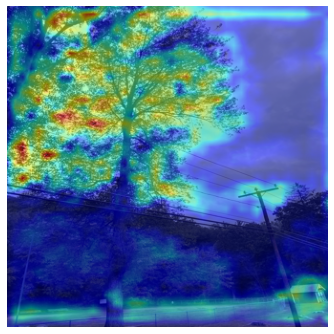

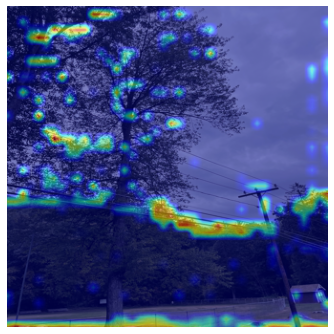

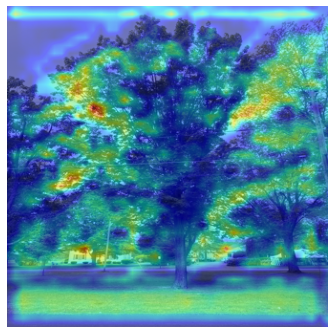

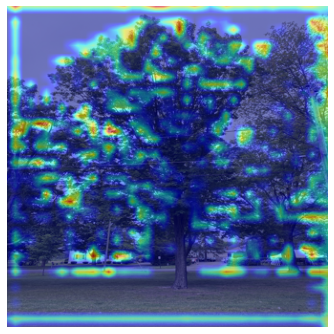

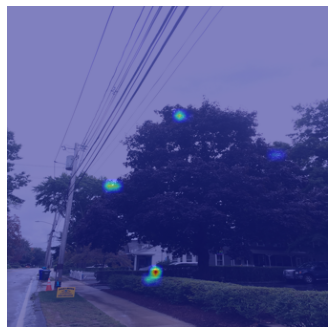

...

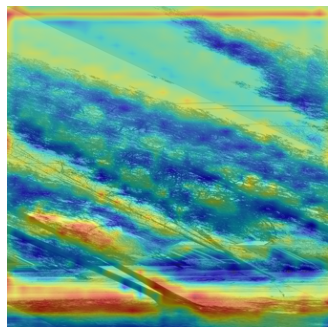

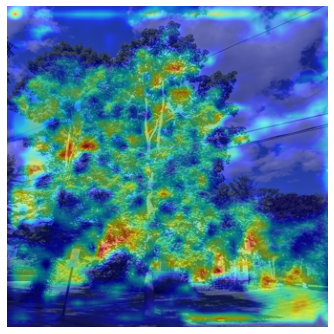

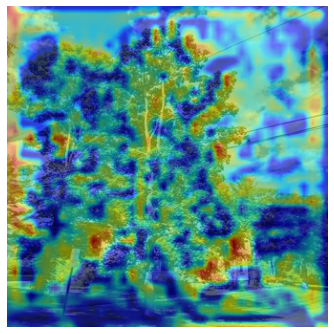

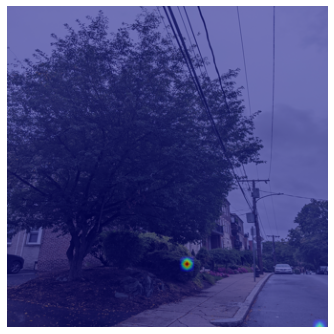

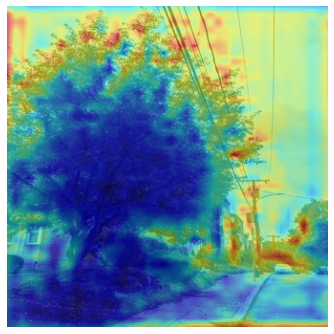

In [19]:
for i in ind:
    renderGradcam(m,y_pred,i,False)
    renderGradcam(m,y_pred,i,True)

In [20]:
pred_group = analyzePredictions(m, test_labels, y_pred)

In [21]:
def expandPredictionProbabilityName(key):
    if key == 'tp':
        key = 'True positive'
    elif key == 'fp':
        key = 'False positive'
    elif key == 'tn':
        key = 'True negative'
    else:
        key = 'False negative'
    return key

In [22]:
def get_summary_statistics(prediction_groups):
    for key,val in prediction_groups.items():
        data = []
        print(expandPredictionProbabilityName(key))
        for v in val:
            data.append(v[1])
        mean = np.round(stat.mean(data), 2)
        median = np.round(stat.median(data), 2)
        std = np.round(stat.stdev(data), 2)
        min_value = np.round(min(data), 2)
        max_value = np.round(max(data), 2)
        # quartile_1 = np.round(np.quantile(data,0.25), 2)
        # quartile_3 = np.round(np.quantile(data,0.75), 2)
        # # Interquartile range
        # iqr = np.round(quartile_3 - quartile_1, 2)
        print('Min: %s' % min_value)
        print('Max: %s' % max_value)
        print('Mean: %s' % mean)        
        print('Median: %s' % median)
        # print('25th percentile: %s' % quartile_1)
        # print('75th percentile: %s' % quartile_3)
        # print('Interquartile range (IQR): %s' % iqr)
        print('Standard deviation: %s' % std,"\n")

## Print summary statistics for the predictions

In [23]:
get_summary_statistics(pred_group)

True positive
Min: 0.5
Max: 0.97
Mean: 0.73
Median: 0.74
Standard deviation: 0.14 

False positive
Min: 0.5
Max: 0.92
Mean: 0.7
Median: 0.7
Standard deviation: 0.1 

True negative
Min: 0.51
Max: 0.96
Mean: 0.72
Median: 0.72
Standard deviation: 0.12 

False negative
Min: 0.51
Max: 0.93
Mean: 0.68
Median: 0.68
Standard deviation: 0.12 



In [24]:
for k,v in pred_group.items():
    print(k,"\n",v,"\n")

tp 
 [(119, 0.5), (121, 0.5), (117, 0.52), (165, 0.52), (161, 0.54), (138, 0.55), (139, 0.55), (155, 0.55), (131, 0.57), (126, 0.59), (158, 0.6), (141, 0.63), (106, 0.65), (107, 0.66), (114, 0.66), (129, 0.69), (127, 0.71), (167, 0.72), (116, 0.73), (140, 0.73), (168, 0.74), (169, 0.76), (113, 0.78), (115, 0.78), (122, 0.79), (142, 0.8), (170, 0.82), (123, 0.83), (150, 0.83), (147, 0.84), (134, 0.86), (124, 0.87), (152, 0.87), (153, 0.87), (130, 0.88), (120, 0.89), (109, 0.9), (118, 0.95), (149, 0.96), (151, 0.97)] 

fp 
 [(77, 0.5), (87, 0.51), (39, 0.52), (11, 0.55), (90, 0.55), (94, 0.58), (15, 0.6), (99, 0.61), (102, 0.62), (10, 0.63), (33, 0.63), (83, 0.63), (29, 0.64), (44, 0.64), (47, 0.64), (88, 0.64), (0, 0.66), (22, 0.66), (80, 0.67), (66, 0.68), (72, 0.69), (81, 0.69), (96, 0.69), (69, 0.7), (75, 0.7), (78, 0.7), (21, 0.71), (92, 0.71), (59, 0.73), (65, 0.73), (70, 0.73), (86, 0.73), (46, 0.74), (40, 0.75), (61, 0.75), (89, 0.76), (25, 0.78), (16, 0.8), (91, 0.8), (93, 0.8),

In [25]:
def returnIdxByProb(group,prob,n):
    indices = []
    for v in pred_group[group]:
        if len(indices) < n:
            if prob == 0.5:
                if(v[1] >= prob) and (v[1] <= prob+0.01):
                    indices.append(v)
            elif prob == 1:
                if(v[1] >= prob-0.01) and (v[1] <= prob):
                    indices.append(v)
            else:
                if(v[1] >= prob-0.01) and (v[1] <= prob + 0.01):
                    indices.append(v)
    return indices

In [26]:
def returnAllGradcamIndices(p_group,n):
    prob = [0.5, 0.6667, 0.833, 1]
    grad_cam_idx = {
        "tp": [],
        "fp": [],
        "tn": [],
        "fn": []
    }
    for p in prob:
        for k in p_group.keys():
            grad_cam_idx[k].append((returnIdxByProb(k,p,n),p))
    return grad_cam_idx

In [27]:
gcam_idx = returnAllGradcamIndices(pred_group,1)

In [28]:
def generateGradcamForGroup(gradcam_idx,group,save_fig=False):
    print(group, "Grad-CAMs\n")
    for val in gradcam_idx[group]:
        if len(val[0]) == 0:
            print("No prediction probabilities in the", val[1], "range (+\- 0.01).\n ")
        else:
            print(len(val[0]),"Gradcams for prediction probabilities in the", val[1], "range (+\- 0.01):", [x[0] for x in val[0]],"\n")
            for i in val[0]:
                print(i[0])
                renderGradcam(m,y_pred,i[0])
            print("\n")

tp Grad-CAMs

1 Gradcams for prediction probabilities in the 0.5 range (+\- 0.01): [119] 

119


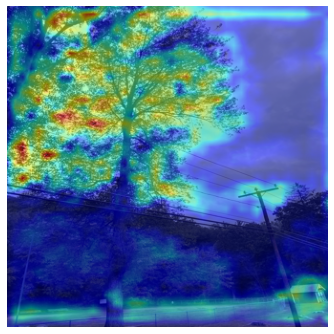



1 Gradcams for prediction probabilities in the 0.6667 range (+\- 0.01): [107] 

107


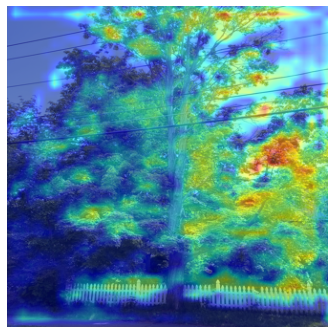



1 Gradcams for prediction probabilities in the 0.833 range (+\- 0.01): [123] 

123


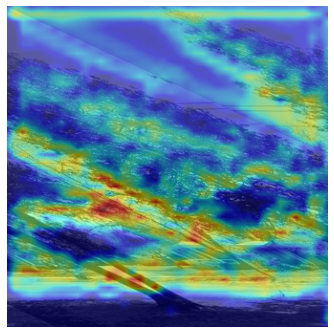



No prediction probabilities in the 1 range (+\- 0.01).
 
fp Grad-CAMs

1 Gradcams for prediction probabilities in the 0.5 range (+\- 0.01): [77] 

77


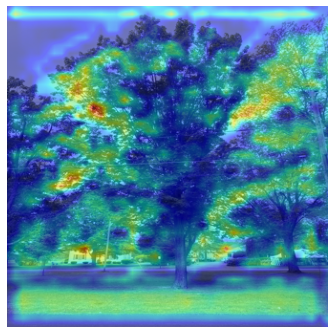



1 Gradcams for prediction probabilities in the 0.6667 range (+\- 0.01): [0] 

0


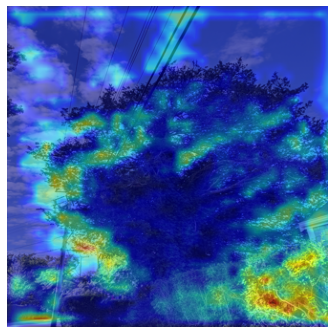



1 Gradcams for prediction probabilities in the 0.833 range (+\- 0.01): [62] 

62


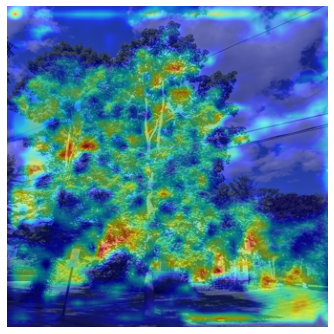



No prediction probabilities in the 1 range (+\- 0.01).
 
tn Grad-CAMs

1 Gradcams for prediction probabilities in the 0.5 range (+\- 0.01): [35] 

35


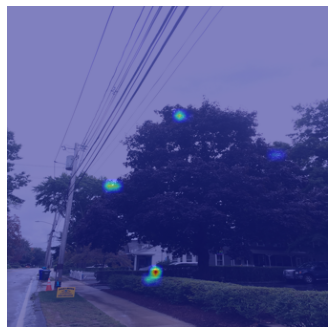



1 Gradcams for prediction probabilities in the 0.6667 range (+\- 0.01): [97] 

97


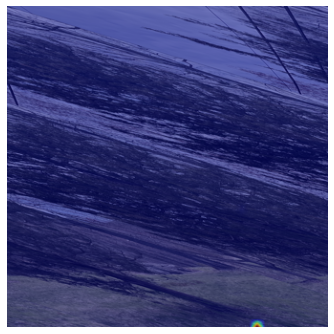



1 Gradcams for prediction probabilities in the 0.833 range (+\- 0.01): [82] 

82


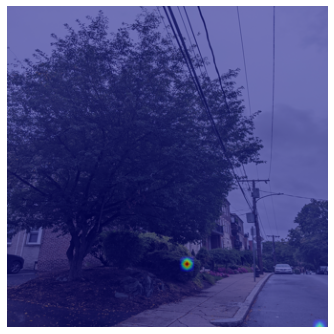



No prediction probabilities in the 1 range (+\- 0.01).
 
fn Grad-CAMs

1 Gradcams for prediction probabilities in the 0.5 range (+\- 0.01): [148] 

148


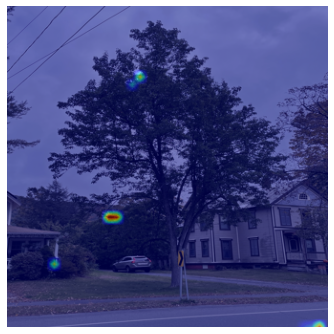



1 Gradcams for prediction probabilities in the 0.6667 range (+\- 0.01): [111] 

111


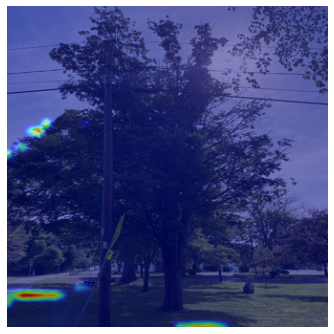



No prediction probabilities in the 0.833 range (+\- 0.01).
 
No prediction probabilities in the 1 range (+\- 0.01).
 


In [29]:
groups = ["tp","fp","tn","fn"]
for g in groups:
    generateGradcamForGroup(gcam_idx,g)

In [30]:
def plotPredictionProbabilities(prediction_group,save_fig=False):
    """Generate summary statistics for True Positive, True Negative, False Positive
    and False Negative Rates"""
    rates = {
        "tp": [],
        "fp": [],
        "tn": [],
        "fn": []
    }
    for key,val in prediction_group.items():
        for v in val:
            rates[key].append(v[1])
    fig, ax = plt.subplots(figsize=(12, 7))
    # Remove top and right border
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    # Remove y-axis tick marks
    ax.yaxis.set_ticks_position('none')
    # Add major gridlines in the y-axis
    ax.grid(color='grey', axis='y', linestyle='-', linewidth=0.25, alpha=0.5)
    # Set plot title
    # ax.set_title('Distribution of prediction probabilitiees', fontsize=24)
    data = [rates["tp"], rates["fp"], rates["tn"], rates["fn"]]
    lbls = [['TP'],['FP'],['TN'],['FN']]
    bp1 = ax.boxplot(data[0], positions=[0], notch=False, widths=0.35, 
                    patch_artist=True, boxprops=dict(facecolor="#E31A1C"), labels=lbls[0]) #
    # plt.xlabel(lbls[0],fontsize=18)
    bp2 = ax.boxplot(data[1], positions=[1], notch=False, widths=0.35, # median to black
                    patch_artist=True, boxprops=dict(facecolor="#FB9A99"), labels=lbls[1])
    bp3 = ax.boxplot(data[2], positions=[2], notch=False, widths=0.35, 
                    patch_artist=True, boxprops=dict(facecolor="#33A02C"), labels=lbls[2])
    bp4 = ax.boxplot(data[3], positions=[3], notch=False, widths=0.35, 
                    patch_artist=True, boxprops=dict(facecolor="#B2DF8A"), labels=lbls[3])
    # ax.set_ylabel('Prediction Probabilities', fontsize=18)
    ax.legend([bp1["boxes"][0], bp2["boxes"][0], bp3["boxes"][0], bp4["boxes"][0]], 
              ['True Positive (TP)','False Positive (FP)','True Negative (TN)','False Negative (FN)'], 
              bbox_to_anchor=(1,0.5), loc='center left', prop={'size': 18})
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)
    plt.grid(which='major', axis='y', linestyle='-', linewidth=0.25, alpha=0.5, zorder=-1.0)
    fig.tight_layout()
    if save_fig:
        plt.savefig('../../figures/boxplot_tp_tn_fp_fn.jpg', dpi=180)
    plt.show()

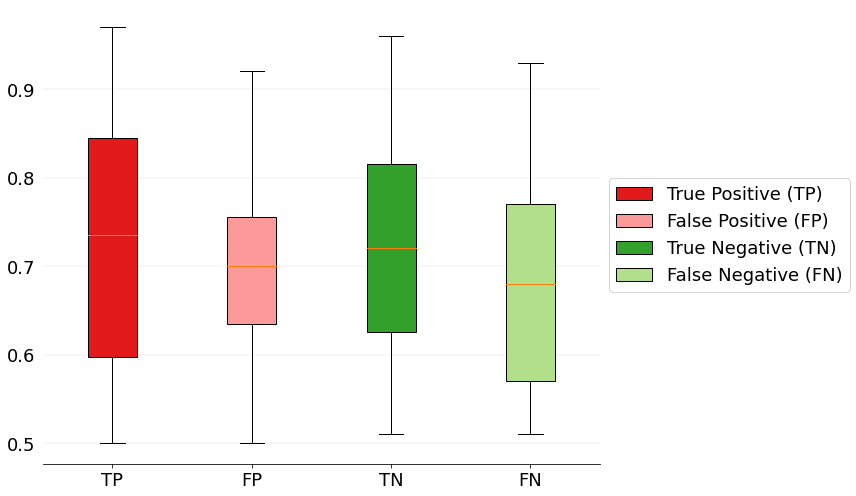

In [31]:
plotPredictionProbabilities(pred_group)

In [32]:
def generateViolinPlot(prediction_group,save_fig=False):
    """Generate a violin plot for True Positive, True Negative, False Positive
    and False Negative Rates"""
    rates = {
        "tp": [],
        "fp": [],
        "tn": [],
        "fn": []
    }
    for key,val in prediction_group.items():
        for v in val:
            rates[key].append(v[1])
    df = pd.DataFrame(columns = ['Group', 'Prediction Probability'])
    for key,value in rates.items():
        rates_df = pd.DataFrame({'Group': expandPredictionProbabilityName(key),
                                 'Prediction Probability':value})
        df = df.append(rates_df, ignore_index=True)
    fig, ax = plt.subplots()
    sns.violinplot(ax = ax,
               data = df,
               palette=['#E31A1C','#FB9A99','#33A02C','#B2DF8A'],
               x = 'Group',
               y = 'Prediction Probability')
    # plt.ylim(0.5,1)
    fig.tight_layout()
    if save_fig:
        plt.savefig('../../figures/violin_plot_tp_tn_fp_fn.png', dpi=180)
    plt.show()

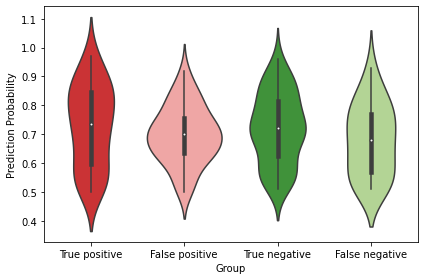

In [33]:
generateViolinPlot(pred_group)

In [34]:
def plotProbabilities(outcome, prediction_group, n_bins=10, font_size=22, save_fig=False):
    # tp,fp,tn,fn = getRates(pred_prob)
    # plt.grid(True)
    rates = {
        "tp": [],
        "fp": [],
        "tn": [],
        "fn": []
    }
    for key,val in prediction_group.items():
        for v in val:
            rates[key].append(v[1])
    plt.figure(figsize=(15,7)).gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    t = ''
    # plt.grid(which='major', axis='y', zorder=-1.0)  
    if outcome == 'tp':
        t = outcome #'true_positive'
        plt.hist(rates[t], color="#E31A1C", bins=n_bins)
    elif outcome == 'tn':
        t = outcome#'true_negative'
        plt.hist(rates[t], color="#33A02C", bins=n_bins)
    elif outcome == 'fp':
        t = outcome#'false_positive'
        plt.hist(rates[t], color="#FB9A99", bins=n_bins)
    elif outcome == 'fn':
        t = outcome#'false_negative'
        plt.hist(rates[t], color="#B2DF8A", bins=n_bins)
    plt.xlabel('Probabilities', fontsize=font_size)
    plt.ylabel('Counts', fontsize=font_size)
    plt.xticks(fontsize=font_size)
    plt.yticks(fontsize=font_size)
    # plt.title(t, fontsize=24)
    plt.grid(which='major', axis='y', zorder=-1.0)
    plt.tight_layout()
    # plt.title('Prediction probabilities for '+t+' Probable/Possible images')
    if save_fig:
        plt.savefig('../../figures/prpo_'+t+'_predictions_dist.jpg', dpi=180)

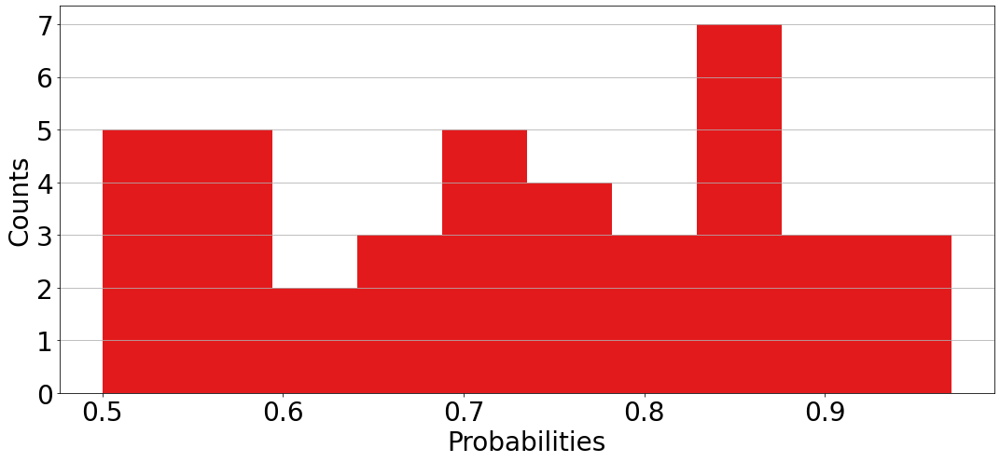

In [35]:
plotProbabilities('tp', pred_group,font_size=28, n_bins=10)

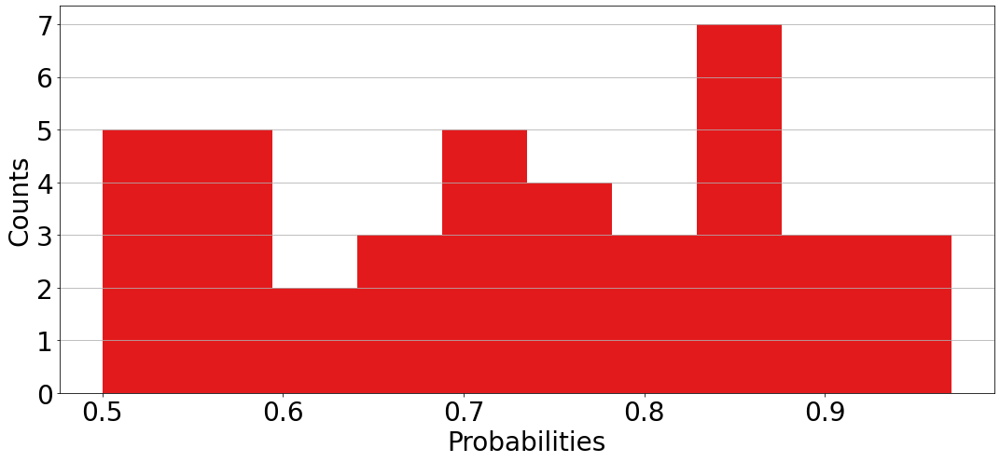

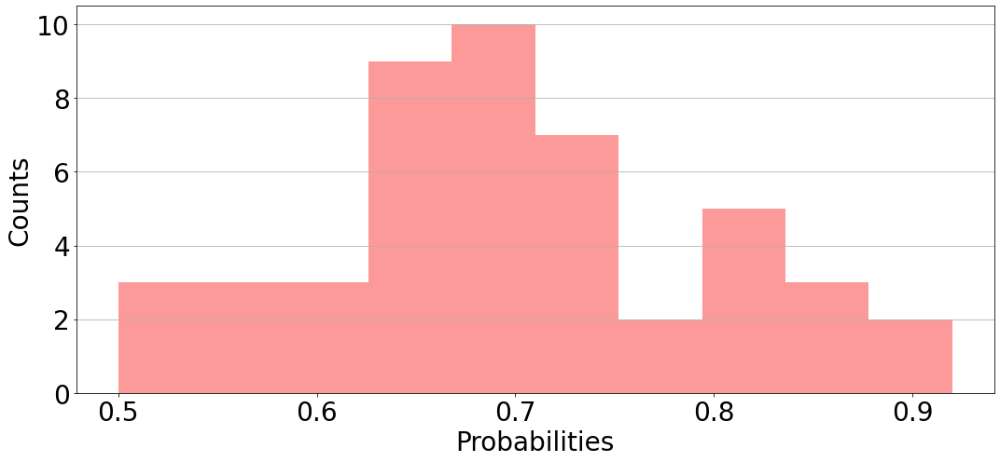

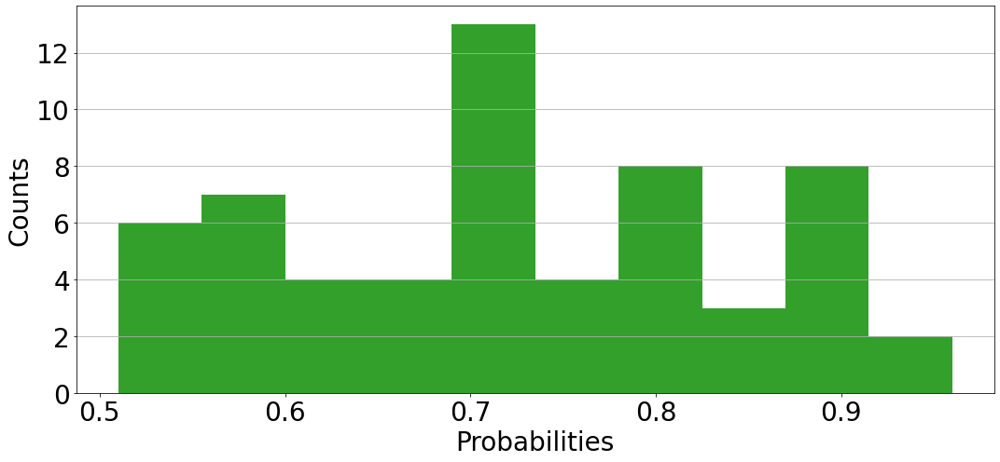

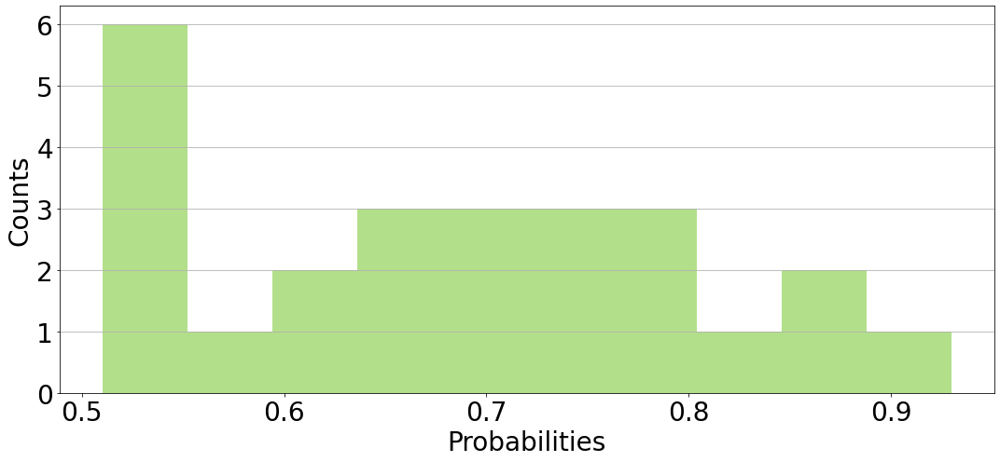

In [36]:
for o in ['tp','fp','tn','fn']:
    plotProbabilities(o, pred_group, font_size=28)